In [1]:
import scanpy as sc
import spin
import numpy as np
import matplotlib.pyplot as plt

# Load data

In [2]:
adata = sc.read_h5ad(
    '/stanley/WangLab/kamal/data/spin_tests/xspecies_raw.h5ad'#,
#     backup_url='idk'
)

# Integrate and cluster across species

In [3]:
adata = spin.integrate(
    adata,
    batch_key='species',
    batch_labels=['marmoset', 'mouse'],
    n_nbrs=30,
    n_samples=12,
)
adata = spin.cluster(
    adata,
    resolution=0.5
)

2023-05-08 21:19:37,463 - SPIN - INFO - Splitting adata by `species`
2023-05-08 21:19:37,475 - SPIN - INFO - Smoothing
2023-05-08 21:19:39,596 - SPIN - INFO - Performing PCA
2023-05-08 21:19:41,054 - SPIN - INFO - Integrating
2023-05-08 21:19:41,251 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-05-08 21:19:58,247 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-05-08 21:19:58,682 - harmonypy - INFO - Iteration 1 of 10
2023-05-08 21:20:21,337 - harmonypy - INFO - Iteration 2 of 10
2023-05-08 21:20:44,411 - harmonypy - INFO - Converged after 2 iterations
2023-05-08 21:20:44,416 - SPIN - INFO - Integration complete
2023-05-08 21:20:44,419 - SPIN - INFO - Finding latent neighbors
/stanley/WangLab/kamal/envs/spin/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will b

/stanley/WangLab/kamal/envs/spin/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


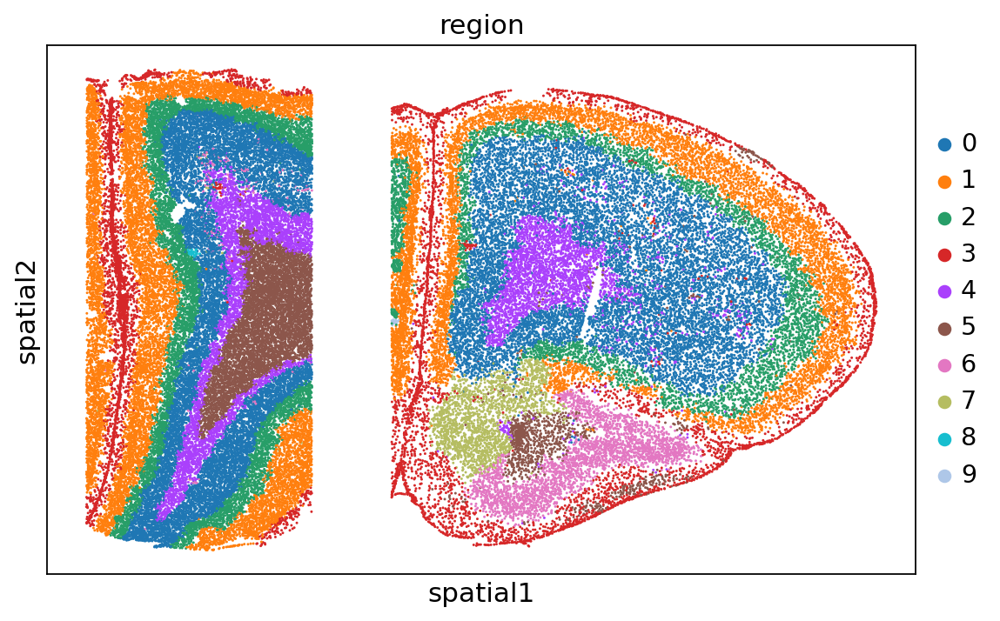

/stanley/WangLab/kamal/envs/spin/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


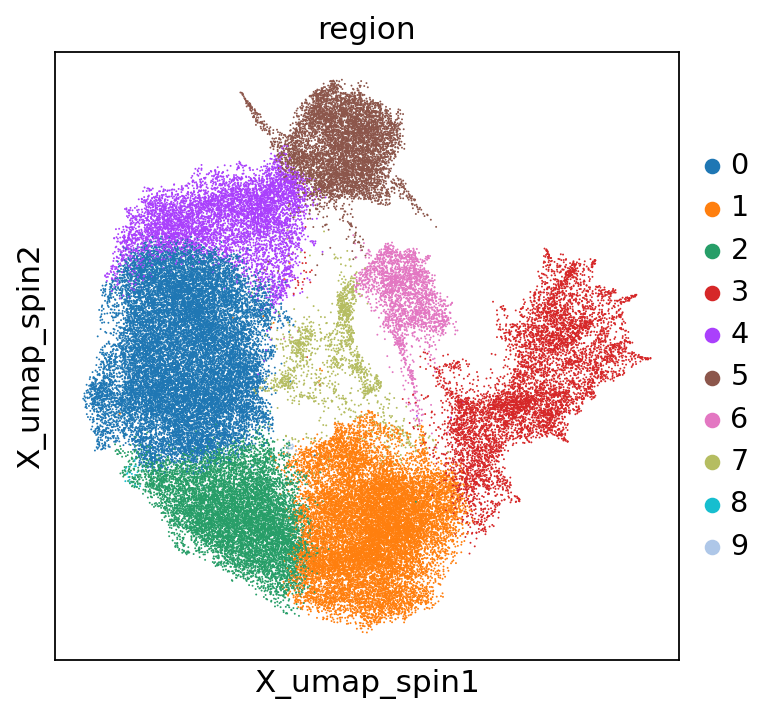

/stanley/WangLab/kamal/envs/spin/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


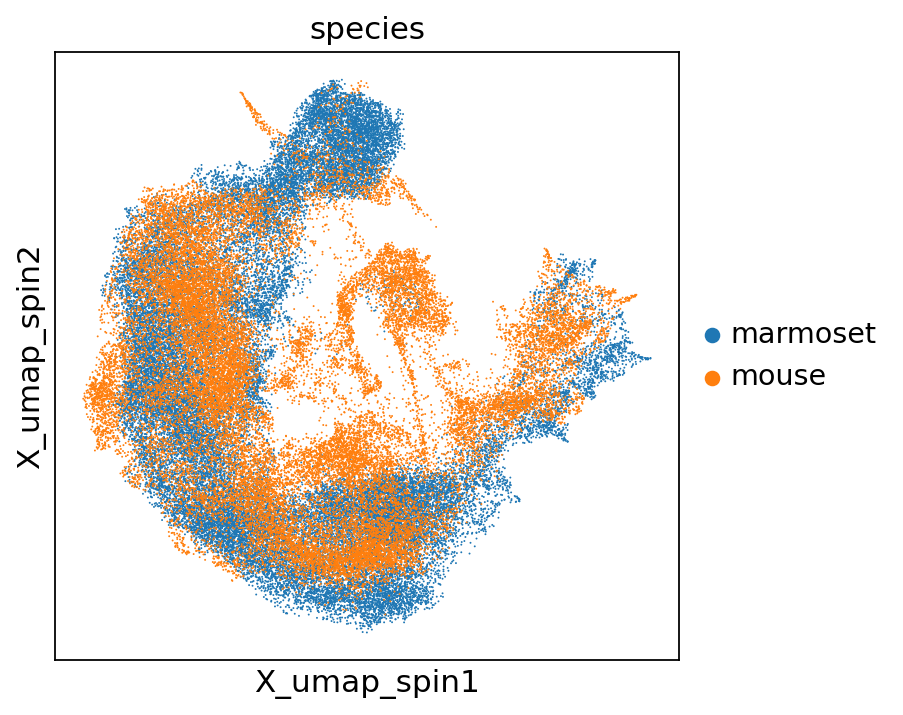

In [4]:
sc.set_figure_params(figsize=(8,5))
sc.pl.embedding(adata, basis='spatial', color='region', s=7)
sc.set_figure_params(figsize=(5,5))
sc.pl.embedding(adata, basis='X_umap_spin', color='region', s=3)
sc.set_figure_params(figsize=(5,5))
sc.pl.embedding(adata, basis='X_umap_spin', color='species', s=3)

## Filter regions

In [5]:
min_n_cells = 500
regions = adata.obs['region'].unique()
good_regions = [region for region in regions if adata.obs['region'].value_counts()[region] > min_n_cells]
adata = adata[np.isin(adata.obs['region'], good_regions)]

/stanley/WangLab/kamal/envs/spin/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


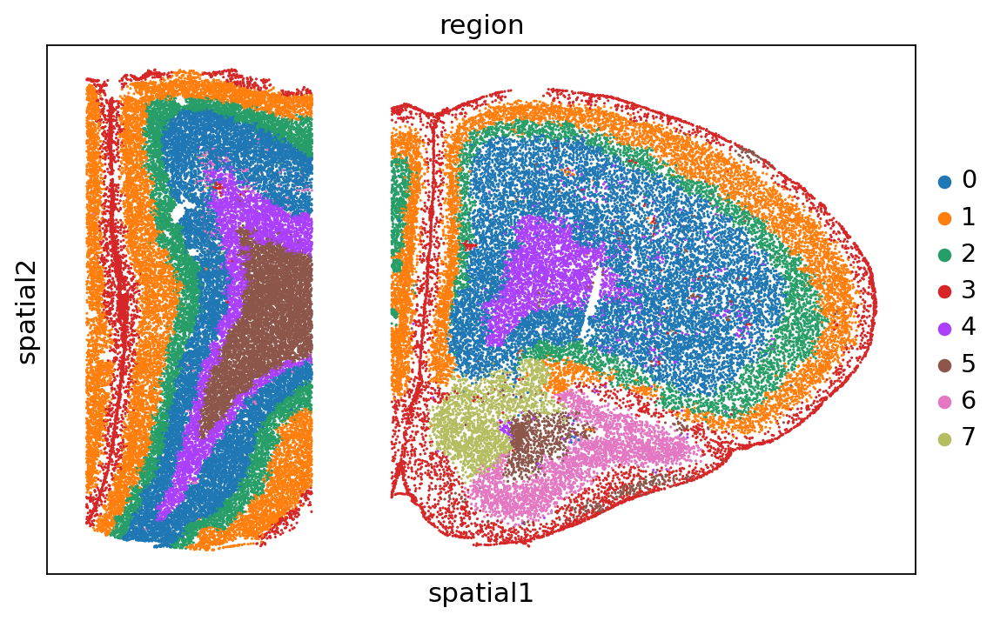

In [6]:
sc.set_figure_params(figsize=(8,5))
sc.pl.embedding(adata, basis='spatial', color='region', s=8)

# DEG analysis

## Across regions

/stanley/WangLab/kamal/envs/spin/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/stanley/WangLab/kamal/envs/spin/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/stanley/WangLab/kamal/envs/spin/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/stanley/WangLab/kamal/envs/spin/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/stanley/WangLab/kamal/envs/spin/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  s

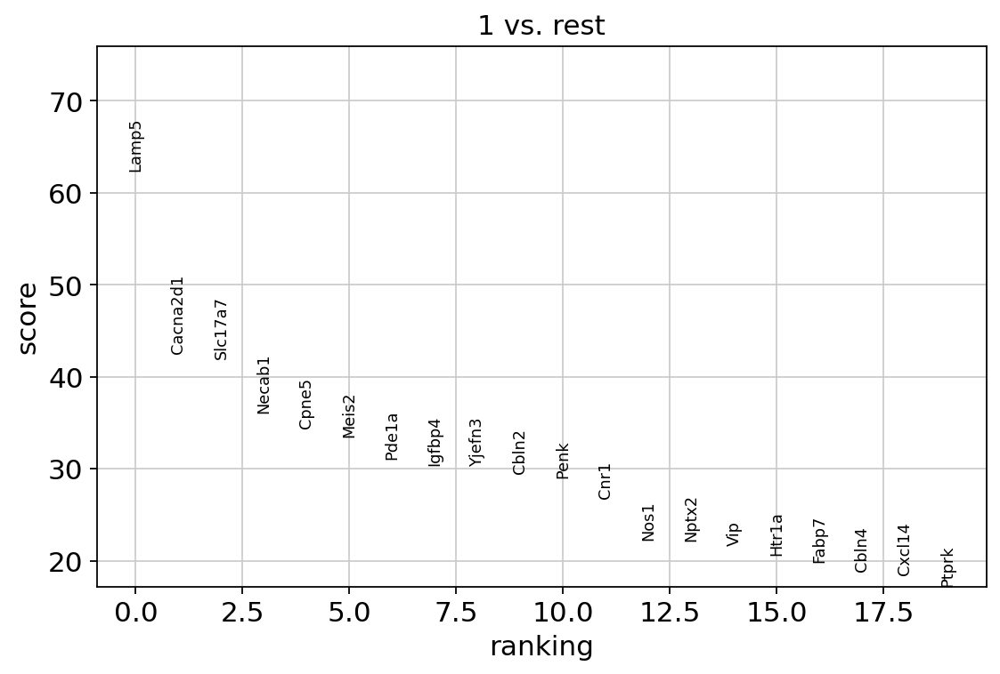

In [7]:
sc.tl.rank_genes_groups(adata, groupby='region')
sc.pl.rank_genes_groups(adata, groups='1')

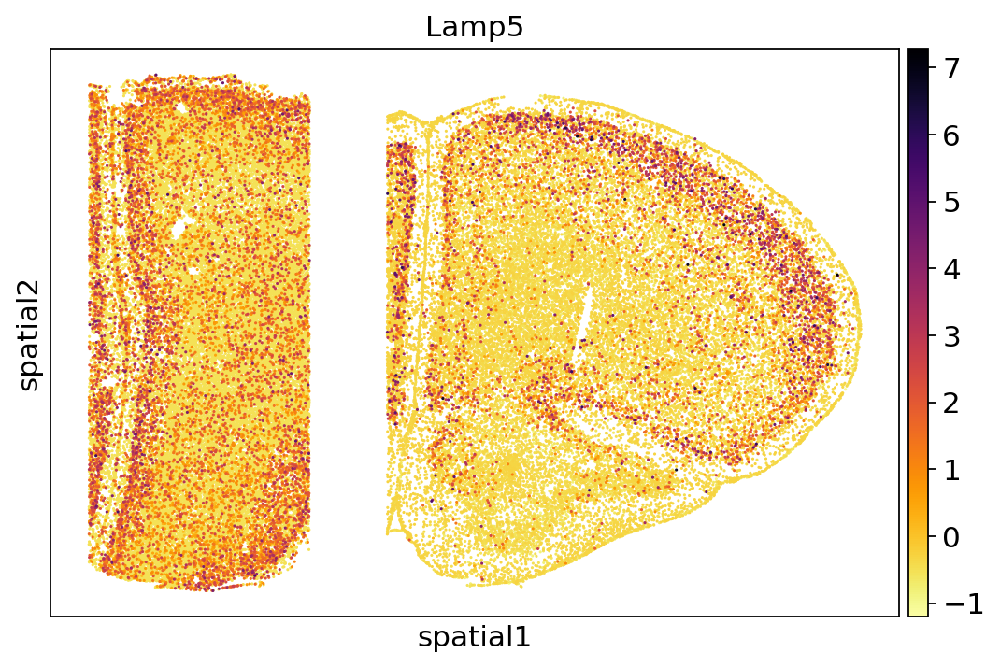

In [8]:
markers = sc.get.rank_genes_groups_df(adata, group='1')
gene = markers['names'][0]

sc.set_figure_params(figsize=(8,5))
sc.pl.embedding(adata, basis='spatial', color=gene, cmap='inferno_r', s=8)

## Across species

/stanley/WangLab/kamal/envs/spin/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:580: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/stanley/WangLab/kamal/envs/spin/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/stanley/WangLab/kamal/envs/spin/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


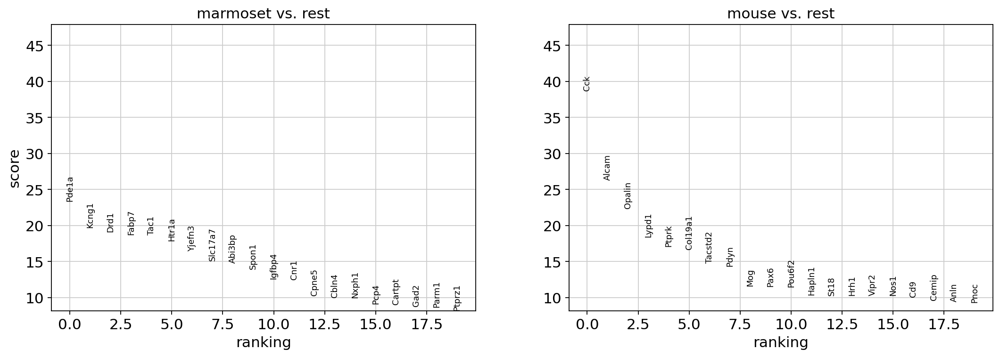

In [9]:
region = '1'
subdata = adata[adata.obs['region']==region]
sc.tl.rank_genes_groups(subdata, groupby='species')
sc.pl.rank_genes_groups(subdata)

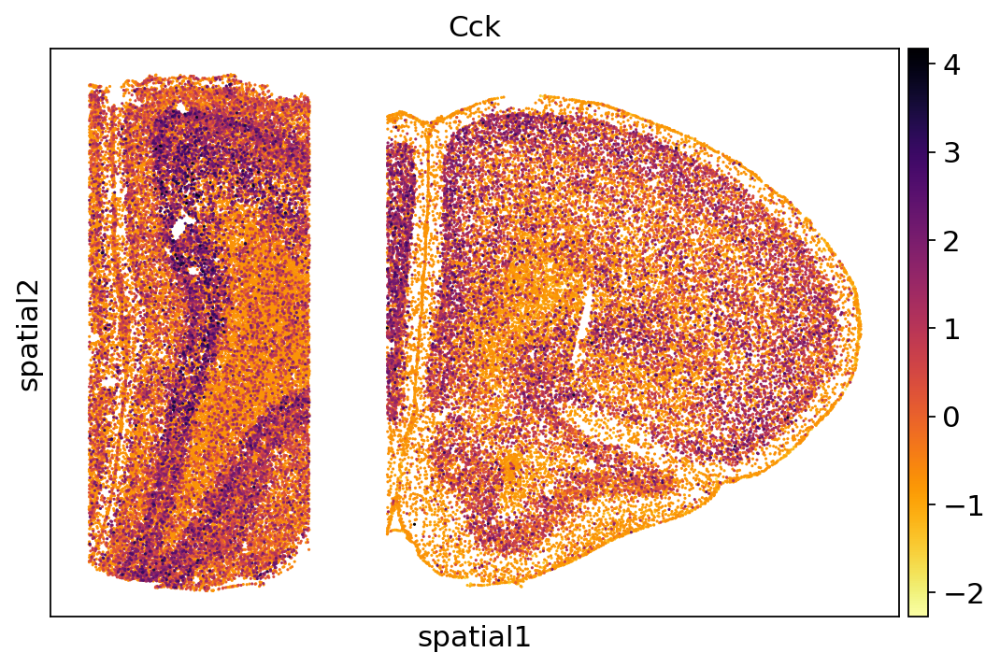

In [10]:
markers = sc.get.rank_genes_groups_df(subdata, group='mouse')
gene = markers['names'][0]

sc.set_figure_params(figsize=(8,5))
sc.pl.embedding(adata, basis='spatial', color=gene, cmap='inferno_r', s=8)

# Trajectory inference

## Diffusion maps

/stanley/WangLab/kamal/envs/spin/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


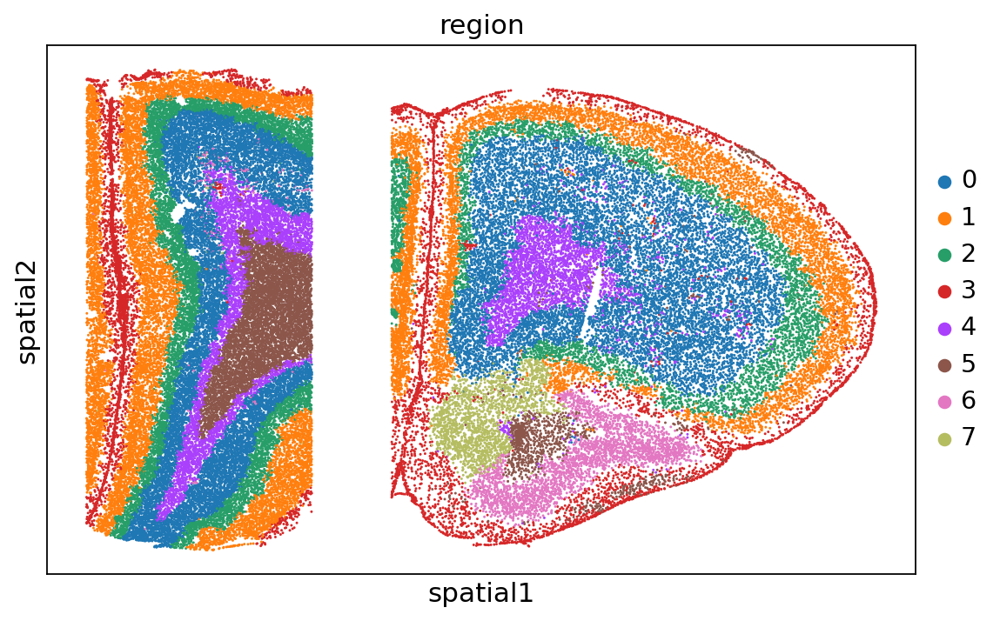

In [11]:
sc.set_figure_params(figsize=(8,5))
sc.pl.embedding(adata, basis='spatial', color='region', s=7)

In [12]:
ctx_regions = ['1', '2', '0', '4']
subdata = adata[np.isin(adata.obs['region'], ctx_regions)]
sc.tl.diffmap(subdata, neighbors_key='region')
subdata.obs['depth'] = -subdata.obsm['X_diffmap'][:,1]

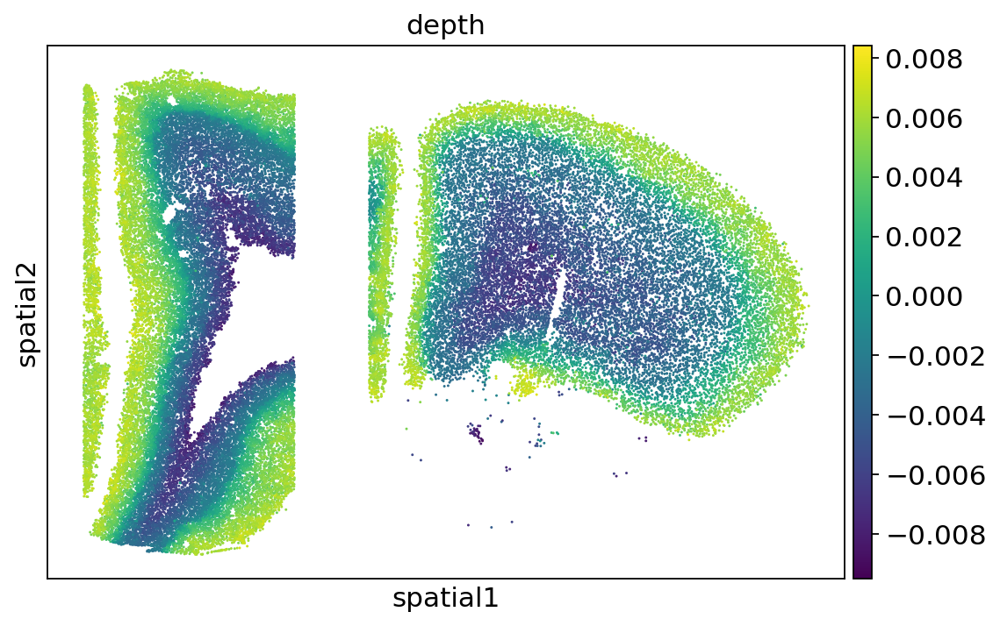

In [13]:
sc.set_figure_params(figsize=(8,5))
sc.pl.embedding(subdata, basis='spatial', color='depth', s=7)

## Calculate gene depth distributions

In [14]:
# Make bins
n_bins = 50
max_depth = subdata.obs['depth'].max()
min_depth = subdata.obs['depth'].min()
increments = (max_depth-min_depth)/n_bins
bins = np.arange(min_depth, max_depth, increments)
subdata.obs['depth_bin'] = np.digitize(subdata.obs['depth'], bins=bins) - 1 # account for idxing at 1

# Make expression nonnegative
subdata.X -= subdata.X.min()

# Separate species
subdata_marmoset = subdata[subdata.obs['species']=='marmoset']
subdata_mouse = subdata[subdata.obs['species']=='mouse']
subdatas = [subdata_marmoset, subdata_mouse]

In [15]:
def get_hists(adatas, gene, start_bin=None, end_bin=None):

    hists = []
    for subdata in adatas:

        # Initialize a few vars
        hist = np.zeros(n_bins)
        depth = subdata.obs['depth_bin'].values
        expr = subdata[:,gene].X.flatten()

        # Wanted to just use np.histogram here to get counts, but it has known binning diffs from np.digitize
        bin_counts = np.zeros(n_bins)
        nonzero_counts = subdata.obs['depth_bin'].value_counts().sort_index()
        for i in nonzero_counts.index:
            bin_counts[i] = nonzero_counts.loc[i]

        # Add each cell's expression into corresponding cell depth bin
        for i in range(len(subdata)):
            hist[depth[i]] += expr[i] / bin_counts[depth[i]]
        
        hist = hist[start_bin:end_bin]

        # Normalize wrt given dataset
        hist /= hist.sum()
        hists.append(hist)
    
    return hists

In [16]:
# Bins at extreme depth values contain a small number of cells, which leads to noise
# Discarding bins at extreme depth values as a result
start_bin = 5
end_bin = 45

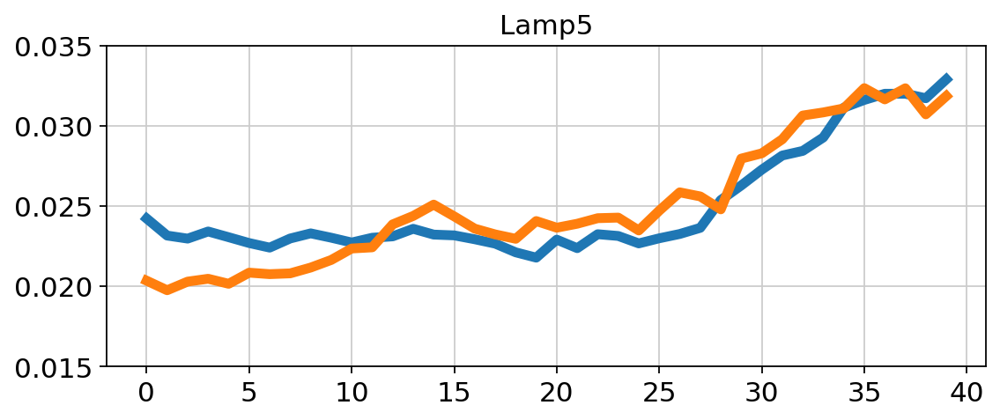

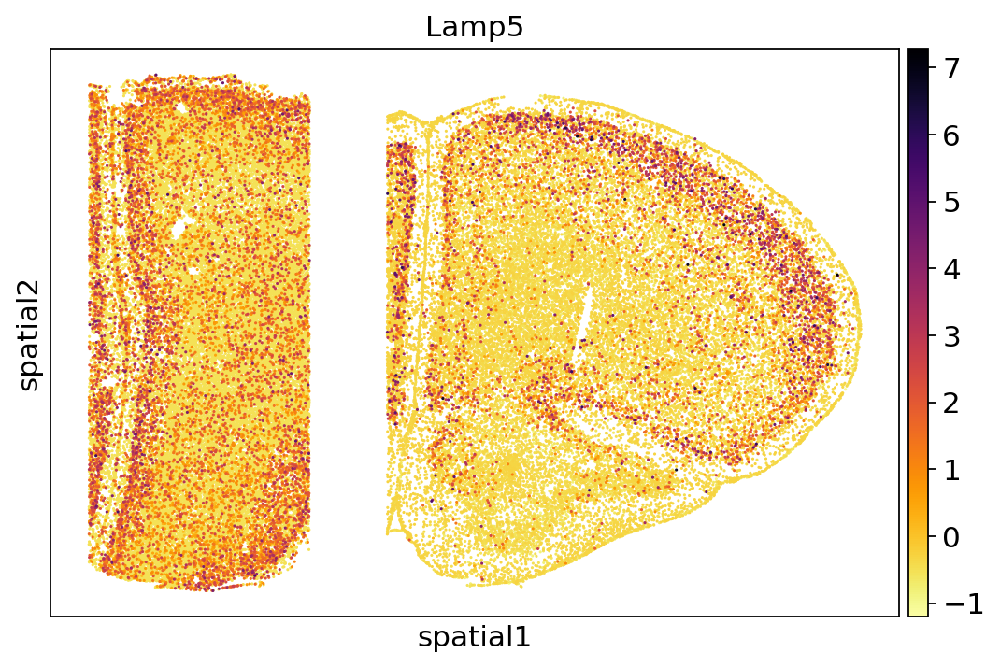

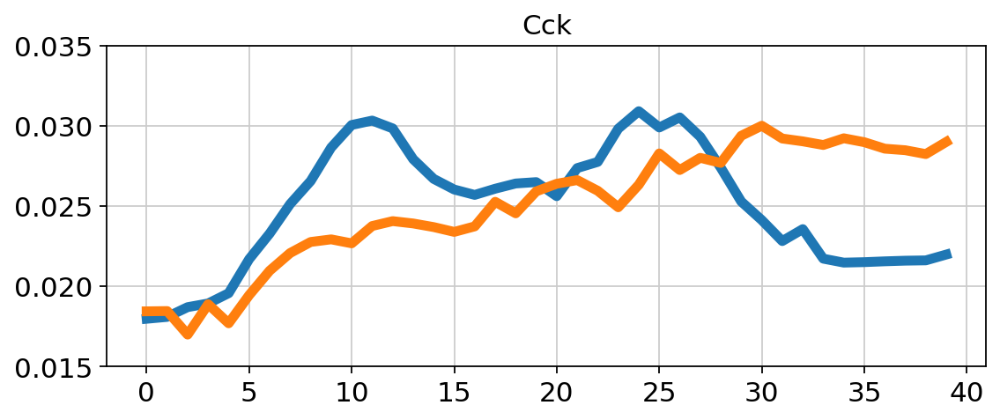

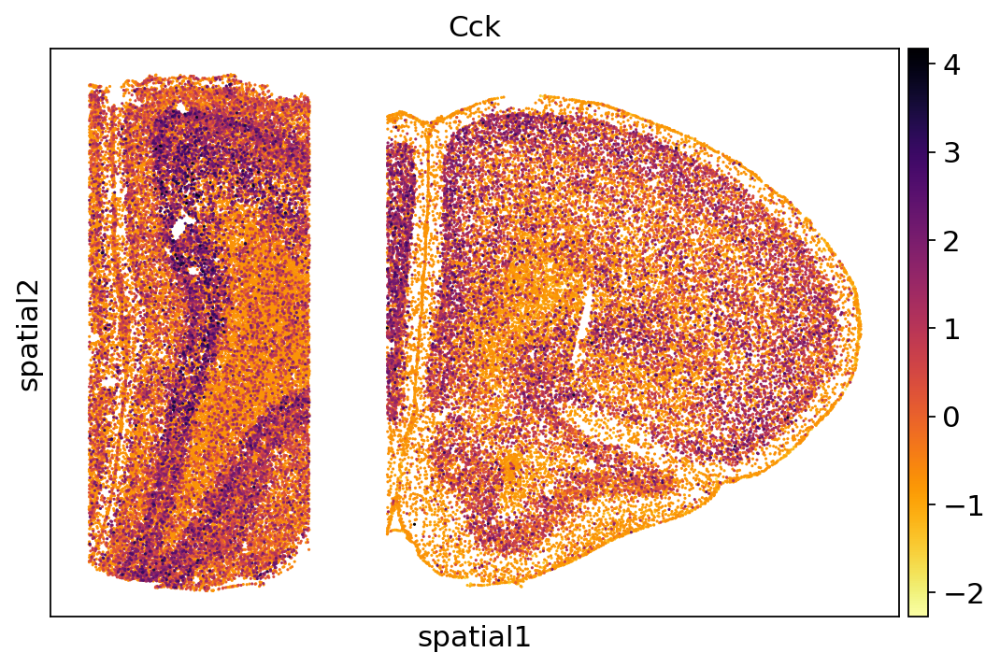

In [17]:
species = ['marmoset', 'mouse']
genes = ['Lamp5', 'Cck']

for gene in genes:

    hists = get_hists(subdatas, gene, start_bin=start_bin, end_bin=end_bin)
    plt.figure(figsize=(8,3))
    for i in range(len(hists)):
        plt.plot(hists[i], label=species[i], linewidth=5)
    plt.title(gene)
    plt.ylim(0.015, 0.035)
    plt.show()

    sc.set_figure_params(figsize=(8,5))
    sc.pl.embedding(adata, basis='spatial', color=gene, cmap='inferno_r', s=8)